In [42]:
from oads_access.oads_access import OADS_Access
import pandas as pd
import os
from PIL import Image
from matplotlib import pyplot as plt

In [6]:
oads = OADS_Access(basedir='/home/niklas/projects/data/oads/')

In [22]:
home_dir = '/mnt/c/Users/nikla/OneDrive - UvA/OADS_Backup'
jpeg_dir = '/mnt/c/Users/nikla/OneDrive - UvA/OADS_Backup/Deidentified/JPG'

df = pd.read_csv(os.path.join(home_dir, 'manual_annotations_annette_220523.csv'))

In [5]:
df.head()

,filename,quality_ok,navigable,applicable_start_area,faces_ok,license_plates_ok,license_reservation,attention_check,correct_blur,no_duplicates,to_annotate
0,0000018494729a82,y,y,y,y,y,y,y,y,y,n
1,000002c2db39399e,y,y,y,y,y,y,y,y,y,n
2,0001515331a1c8c0,y,y,y,y,y,y,y,y,y,n
3,0002cac8c8ced0c8,y,y,y,y,y,y,y,y,y,n
4,00030323eb99c2e0,y,y,y,n,y,y,y,y,y,n


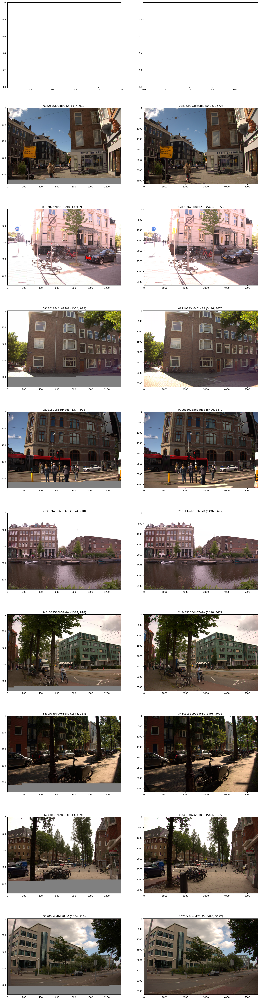

In [49]:
n = 10

fig, ax = plt.subplots(n,2, figsize=(20,n*8))

for i in range(n):
    f = df[(df['quality_ok'] == 'n')].iloc[i].filename
    img = Image.open(os.path.join(jpeg_dir, f'{f}.JPG'))
    try:
        raw_image = oads.load_image(image_name=f)[0]
    except KeyError:
        continue
    # print(f, img.size)


    ax[i, 0].imshow(img)
    ax[i, 1].imshow(raw_image)

    ax[i, 0].set_title(f'{f} {img.size}')
    ax[i, 1].set_title(f'{f} {raw_image.size}')

    # print(f, raw_image.size)

plt.show()